In [103]:
from satpy.scene import Scene
from pathlib import Path
import subprocess
from pyresample import geometry
import matplotlib.pyplot as plt
from glob import glob

In [107]:
#SOURCE_PATH = Path("/storage/data/ocf/solar_pv_nowcasting/nowcasting_dataset_pipeline/raw/EUMETSAT/SEVIRI_RSS/downloaded_manually_and_sorted/2019/06/01/12/04/MSG3-SEVI-MSG15-0100-NA-20190601120416.190000000Z-20190601120433-1358336-1.nat.bz2")
filenames = glob("/home/jack/temp/*.nat")

In [108]:
filenames

['/home/jack/temp/MSG3-SEVI-MSG15-0100-NA-20190601124916.989000000Z-20190601124935-1358336-1.nat',
 '/home/jack/temp/MSG3-SEVI-MSG15-0100-NA-20190601123916.811000000Z-20190601123935-1358336-1.nat',
 '/home/jack/temp/MSG3-SEVI-MSG15-0100-NA-20190601120416.190000000Z-20190601120433-1358336-1.nat',
 '/home/jack/temp/MSG3-SEVI-MSG15-0100-NA-20190601122416.544000000Z-20190601122433-1358336-1.nat',
 '/home/jack/temp/MSG3-SEVI-MSG15-0100-NA-20190601123416.722000000Z-20190601123434-1358336-1.nat',
 '/home/jack/temp/MSG3-SEVI-MSG15-0100-NA-20190601125917.167000000Z-20190601125935-1358336-1.nat',
 '/home/jack/temp/MSG3-SEVI-MSG15-0100-NA-20190601120916.279000000Z-20190601120933-1358336-1.nat',
 '/home/jack/temp/MSG3-SEVI-MSG15-0100-NA-20190601124416.900000000Z-20190601124434-1358336-1.nat',
 '/home/jack/temp/MSG3-SEVI-MSG15-0100-NA-20190601125417.078000000Z-20190601125504-1358336-1.nat',
 '/home/jack/temp/MSG3-SEVI-MSG15-0100-NA-20190601121416.367000000Z-20190601121434-1358336-1.nat',
 '/home/ja

In [111]:
len(filenames)

12

In [3]:
def decompress(full_bzip_filename: Path) -> Path:
    # --keep: Keep the original .bz2 file (don't delete it)
    # --force: Overwrite the .nat file if it already exists.
    # -m1000: Maximum memory usage in 1MB steps (1000 = 1,000 MB)
    process = subprocess.run(
        ['pbzip2', '--decompress', '--keep', '--force', '-m1000', full_bzip_filename])
    process.check_returncode()
    full_nat_filename = full_bzip_filename.parent / full_bzip_filename.stem
    assert full_nat_filename.exists()
    return full_nat_filename

In [109]:
%%time
# full_nat_filename = decompress(SOURCE_PATH)

CPU times: user 10 µs, sys: 4 µs, total: 14 µs
Wall time: 26.5 µs


Reading from a MergerFS array will cause numpy's memmap to throw an OS Error:

```python
~/miniconda3/envs/nowcasting_dataset/lib/python3.9/site-packages/numpy/core/memmap.py in __new__(subtype, filename, dtype, mode, offset, shape, order)
    265             bytes -= start
    266             array_offset = offset - start
--> 267             mm = mmap.mmap(fid.fileno(), bytes, access=acc, offset=start)
    268 
    269             self = ndarray.__new__(subtype, shape, dtype=descr, buffer=mm,

OSError: [Errno 19] No such device
```

This isn't a huge problem, because we can read from the underlying ZFS mirrors, which is probably faster, anyway.

In [110]:
%%time

# TODO: Try opening multiple .nat files at once, to see if the 150ms is constant, or scales with the number of files.

scene = Scene(reader='seviri_l1b_native', filenames=filenames)

CPU times: user 477 ms, sys: 0 ns, total: 477 ms
Wall time: 476 ms


In [112]:
dataset_names = scene.available_dataset_names()
dataset_names

['HRV',
 'IR_016',
 'IR_039',
 'IR_087',
 'IR_097',
 'IR_108',
 'IR_120',
 'IR_134',
 'VIS006',
 'VIS008',
 'WV_062',
 'WV_073']

In [113]:
%%time
scene.load(dataset_names)

/home/jack/miniconda3/envs/nowcasting_dataset/lib/python3.9/site-packages/pyproj/crs/crs.py:1256: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  return self._crs.to_proj4(version=version)
/home/jack/miniconda3/envs/nowcasting_dataset/lib/python3.9/site-packages/pyproj/crs/crs.py:1256: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  return self._crs.to_proj4(version=version)
/home/jack/miniconda3/envs/nowcasting_dataset/lib/python3.9/site-packages/pyproj/crs/crs.py:1256: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-

CPU times: user 4.01 s, sys: 68.1 ms, total: 4.08 s
Wall time: 4.06 s


/home/jack/miniconda3/envs/nowcasting_dataset/lib/python3.9/site-packages/pyproj/crs/crs.py:1256: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  return self._crs.to_proj4(version=version)


In [117]:
%%time

# Adapted from https://github.com/openclimatefix/Satip/blob/e46013831071e8e4a4759ca46421d5355c342d1f/satip/reproj.py#L139
projection = {
    'ellps': 'WGS84',
    'proj': 'tmerc',  # Transverse Mercator
    'units': 'm'  # meters
}

area_definition = geometry.AreaDefinition.from_area_of_interest(
    area_id="TM",
    projection=projection,
    shape=(64, 64),  # height, width
    center=(-0.3E6, 6E6),  # x, y
    resolution=4000 # meters per pixel??
)  

resampled_scene = scene.resample(destination=area_definition, nprocs=16, radius_of_influence=5000)

CPU times: user 2min 43s, sys: 19.8 s, total: 3min 3s
Wall time: 1min 14s


In [101]:
print(resampled_scene)

<xarray.DataArray 'my_index-4aebad7ad0ae2e119f2ec660ddc32ba2' (y: 64, x: 64)>
dask.array<my_index, shape=(64, 64), dtype=float32, chunksize=(64, 64), chunktype=numpy.ndarray>
Coordinates:
    crs      object PROJCRS["unknown",BASEGEOGCRS["unknown",DATUM["Unknown ba...
  * y        (y) float64 6.126e+06 6.122e+06 6.118e+06 ... 5.878e+06 5.874e+06
  * x        (x) float64 -4.26e+05 -4.22e+05 -4.18e+05 ... -1.78e+05 -1.74e+05
Attributes: (12/19)
    orbital_parameters:                     {'projection_longitude': 9.5, 'pr...
    sun_earth_distance_correction_applied:  True
    sun_earth_distance_correction_factor:   1.0280062341635272
    units:                                  %
    wavelength:                             0.7 µm (0.5-0.9 µm)
    standard_name:                          toa_bidirectional_reflectance
    ...                                     ...
    name:                                   HRV
    resolution:                             1000.134348869
    calibration:     

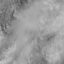

In [102]:
img = resampled_scene.show("HRV")
img

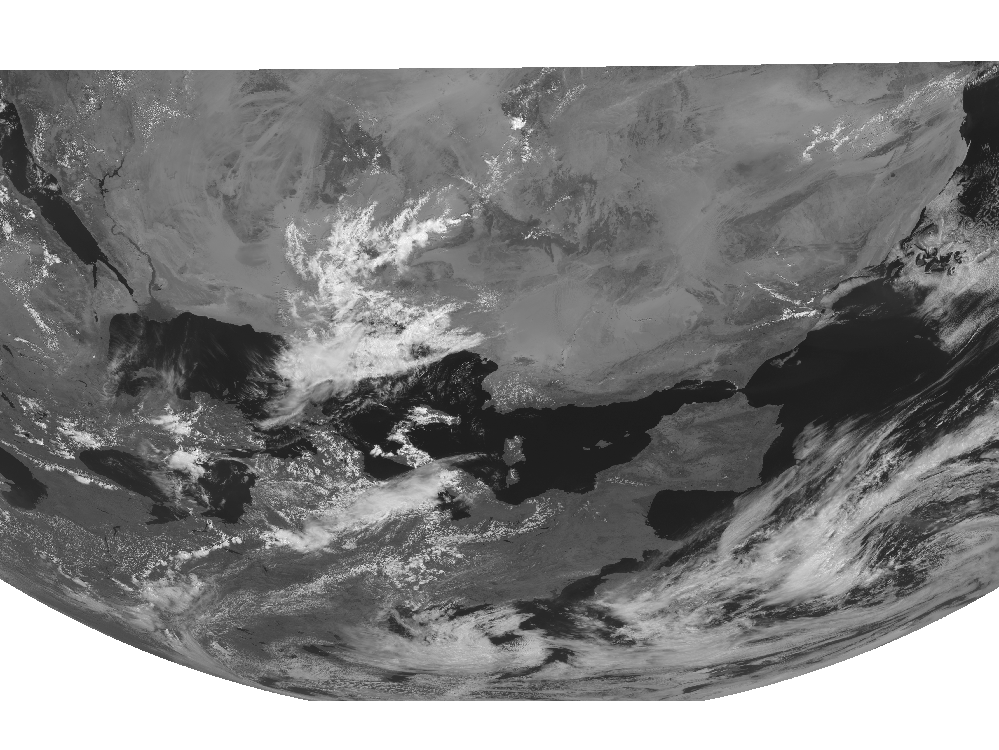

In [75]:
scene.show("HRV")